In [ ]:
##### import numpy as np
import matplotlib.pyplot as plt

from pathlib import Path
import os
import cv2
import random
random.seed(42)
from sklearn.preprocessing import normalize
import pickle

from scipy.spatial import distance

In [2]:
HOME="./Faces_FA_FB/"
fa_H="fa_H"
fa_L="fa_L"
fb_H="fb_H"
fb_L="fb_L"

training_location_H=HOME+"/"+fa_H
testing_location_H=HOME+"/"+fb_H
training_location_L=HOME+"/"+fa_L
testing_location_L=HOME+"/"+fb_L

In [3]:
def get_images_id(location):
    images_name=[]
    for file in os.listdir(location):
        if file.endswith(".pgm"):
            images_name.append(file)

    data_id=np.array([x[:5] for x in images_name])
    images=np.array([cv2.imread(location+"/"+x) for x in images_name])
    return images,data_id

training_images_H,training_data_id_H=get_images_id(training_location_H)
testing_images_H,testing_data_id_H=get_images_id(testing_location_H)
training_images_L,training_data_id_L=get_images_id(training_location_L)
testing_images_L,testing_data_id_L=get_images_id(testing_location_L)

In [4]:
def show_multiple_images_10(images,title=None):
    rows=int(len(images)/5)
    if rows%1>0:
        rows=rows+1
    columns=5
    fig = plt.figure(figsize=(1.5*columns,1.5*rows))
    if title:
        fig.suptitle(title,fontsize=10)
    
    for i in range(len(images)):
        # Adds a subplot at the 1st position
        fig.add_subplot(rows, columns, i+1)
        # showing image
        plt.imshow(images[i],cmap='gray')
        plt.axis('off')
        plt.savefig("a_I_largest_10.svg",dpi=300,format='svg')
        

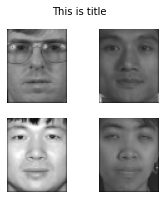

In [5]:
def show_multiple_images(images,title=None):
    rows=int(len(images)/2)
    if rows%1>0:
        rows=rows+1
    columns=2
    fig = plt.figure(figsize=(1.5*columns,1.5*rows))
    if title:
        fig.suptitle(title,fontsize=10)
    
    for i in range(len(images)):
        # Adds a subplot at the 1st position
        fig.add_subplot(rows, columns, i+1)
        # showing image
        plt.imshow(images[i],cmap='gray')
        plt.axis('off')
    plt.show()
        
show_multiple_images(training_images_H[:4]/255,"This is title")

In [6]:
class MyPCA_testing:
    
    def __init__(self, read_pickle_model, information=100):
        self.read_pickle_model=read_pickle_model
        self.information=information
        self.find_components()
        
    def find_components(self):        
        with open(self.read_pickle_model,'rb') as filehandler:
            object_file = pickle.load(filehandler)
        self.projections,self.mean,self.eig_vals_sorted,self.eig_vecs_sorted,self.data_id=object_file
        
        image_shape=np.array(self.mean).shape
#         self.mean=np.array(self.mean).flatten()
        #Finding n_components from teh amount of information to take
        if self.information>1:
            self.information=self.information/100
        if self.information!=None:
            info_cumsum=np.cumsum(self.eig_vals_sorted)
            
            info_cumsum_percent=np.array(info_cumsum)/info_cumsum[-1]
            for i in range(len(info_cumsum)):
                if info_cumsum_percent[i]>=self.information:
                    self.n_components=i
                    break
                    
        self.components =self. eig_vecs_sorted[:self.n_components]
        self.eign_val_components = self.eig_vals_sorted[:self.n_components]
        self.projections=self.projections[:,:self.n_components]
    
    def distance_with_faces(self,x):
#         print(x.shape,self.eign_val_components.shape,self.projections[0].shape)
#         distances=np.array([np.sum(np.square(x-a)/self.eign_val_components) for a in self.projections])
        inverse_eigen_val_matrix=np.diag(1/self.eign_val_components)
        print(x.shape,self.projections[0].shape,inverse_eigen_val_matrix.shape)
        distances=[distance.mahalanobis(x,a,inverse_eigen_val_matrix) for a in self.projections]
        return distances
        
    def predict_a_face(self, item, r):
        P = item[:,:,0].copy()
        P = (P - self.mean).flatten()
        P_proj=self.components.dot(P)
        
        distances=self.distance_with_faces(P_proj)
        sorted_arg=np.argsort(distances)
        args_to_see=sorted_arg[:r]
        return np.array([self.data_id[x] for x in args_to_see])
 
    
    def getMean(self):
        return self.mean
    
    def getComponents(self):
        return self.components
    
    def getProjections(self):
        return self.projections

In [7]:
PCA1=MyPCA_testing(read_pickle_model="High_full_images.pickle",information=80)
predictions=PCA1.predict_a_face(training_images_H[2],15)
predictions,training_data_id_H

(15,) (15,) (15, 15)


(array(['00029', '00020', '00029', '00505', '00041', '00036', '00035',
        '00476', '00026', '00600', '00029', '00027', '00005', '00042',
        '00040'], dtype='<U5'),
 array(['00476', '00611', '00029', ..., '00790', '00877', '00465'],
       dtype='<U5'))

In [8]:
def find_accuracy_r(model,r,images,data_id):
    predictions_all=np.array([model.predict_a_face(image,r) for image in images])
    correct_prediction_inside_r_train=np.sum(np.array([1 if data_id[i] in predictions_all[i] else 0 for i in range(len(data_id))]))
    return correct_prediction_inside_r_train/len(images)

find_accuracy_r(PCA1,1,training_images_H,training_data_id_H)

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

1.0

In [9]:
def find_three_right_three_wrong(model,training_images,training_data_id,images,data_id,r):
    predictions_all=np.array([model.predict_a_face(image,r) for image in images])
    print(data_id[1],predictions_all[1])
    if_correct=np.array([1 if data_id[i] in predictions_all[i] else 0 for i in range(len(data_id))])
    corrects_index=[]
    wrongs_index=[]
    for index,val in enumerate(if_correct):
#         print(val)
        if val==1:
            corrects_index.append(index)
        else:
            wrongs_index.append(index)
    correct_image_pairs=np.array([[images[i],training_images[np.where(training_data_id==predictions_all[i])][0]] for i in corrects_index[:3]])
    wrong_image_pairs=np.array([[images[i],training_images[np.where(training_data_id==predictions_all[i])][0]] for i in wrongs_index[:3]])
    return correct_image_pairs,wrong_image_pairs

correct_image_pairs,wrong_image_pairs=find_three_right_three_wrong(PCA1,
                                                                  training_images_H,
                                                                  training_data_id_H,
                                                                  testing_images_H,
                                                                  testing_data_id_H,
                                                                  1)
                                  

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

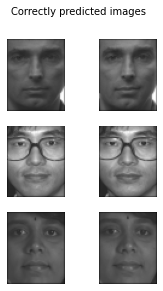

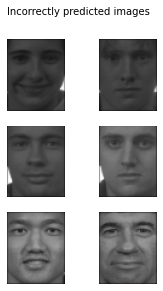

In [10]:
def show_pair_of_images(pair_of_images,title):
    images=[]
    for i in range(len(pair_of_images)):
        images.append(pair_of_images[i][0])
        images.append(pair_of_images[i][1])
    show_multiple_images(images,title)
    
show_pair_of_images(correct_image_pairs,"Correctly predicted images")
show_pair_of_images(wrong_image_pairs,"Incorrectly predicted images")

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (48, 48)
(48,) (48,) (

(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)
(113,) (113,) (113, 113)


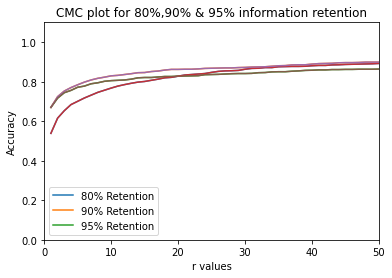

In [11]:
def plot_CMC_curve(model,images,data_id):
    x=np.arange(1,51,1)
    y=np.array([find_accuracy_r(model,i,images,data_id) for i in x])
    plt.plot(x,y)
    return x,y

model1=MyPCA_testing(read_pickle_model="High_full_images.pickle",information=80)
model2=MyPCA_testing(read_pickle_model="High_full_images.pickle",information=90)
model3=MyPCA_testing(read_pickle_model="High_full_images.pickle",information=95)

r_value_test_80,accuracy_test_80=plot_CMC_curve(model1,testing_images_H,testing_data_id_H)
r_value_test_90,accuracy_test_90=plot_CMC_curve(model2,testing_images_H,testing_data_id_H)
r_value_test_95,accuracy_test_95=plot_CMC_curve(model3,testing_images_H,testing_data_id_H)


plt.plot(r_value_test_80,accuracy_test_80, alpha=0.9, markersize=10)
plt.plot(r_value_test_90,accuracy_test_90, alpha=0.9, markersize=10)
plt.plot(r_value_test_95,accuracy_test_95, alpha=0.9, markersize=10)
plt.legend(['80% Retention', '90% Retention','95% Retention'])
plt.xlim(0,50)
plt.ylim(0,1.1)
plt.xlabel('r values')
plt.ylabel('Accuracy')
plt.title(f"CMC plot for 80%,90% & 95% information retention")
plt.show()

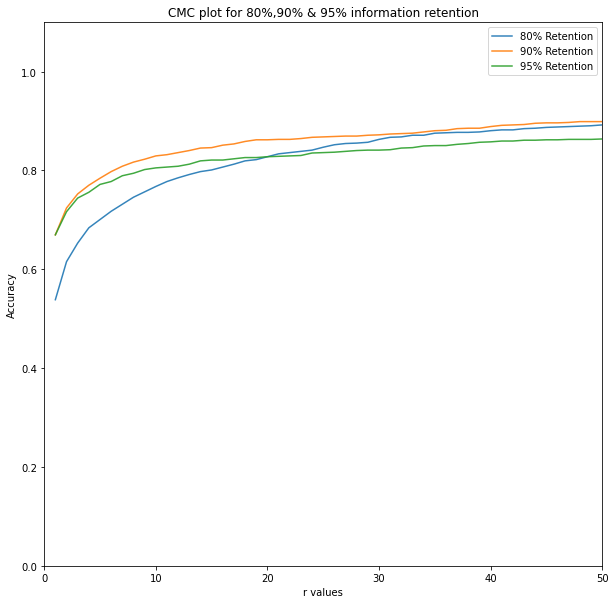

In [15]:
plt.figure(figsize=(10,10))
plt.plot(r_value_test_80,accuracy_test_80, alpha=0.9, markersize=10)
plt.plot(r_value_test_90,accuracy_test_90, alpha=0.9, markersize=10)
plt.plot(r_value_test_95,accuracy_test_95, alpha=0.9, markersize=10)
plt.legend(['80% Retention', '90% Retention','95% Retention'])
plt.xlim(0,50)
plt.ylim(0,1.1)
plt.xlabel('r values')
plt.ylabel('Accuracy')
plt.title(f"CMC plot for 80%,90% & 95% information retention")
plt.show()

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

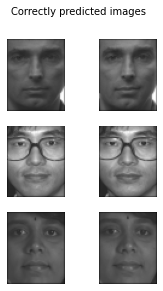

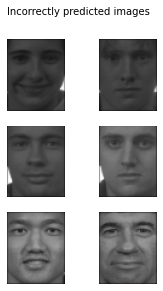

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (15, 15)
(15,) (15,) (

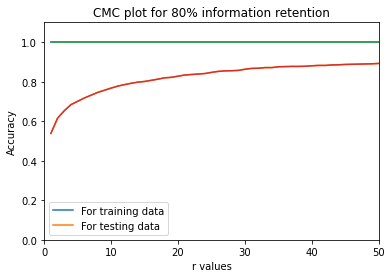

In [12]:
def question3aii(model_file,training_images,training_data_id,testing_images,testing_data_id,information):
    model=MyPCA_testing(read_pickle_model="High_full_images.pickle",information=information)
    
    correct_image_pairs,wrong_image_pairs=find_three_right_three_wrong(model,
                                                                  training_images,
                                                                  training_data_id,
                                                                  testing_images,
                                                                  testing_data_id,
                                                                  1)
    
    show_pair_of_images(correct_image_pairs,"Correctly predicted images")
    show_pair_of_images(wrong_image_pairs,"Incorrectly predicted images")
    
    
    r_value_train,accuracy_train=plot_CMC_curve(model,training_images,training_data_id)
    r_value_test,accuracy_test=plot_CMC_curve(model
                                              ,testing_images,testing_data_id)
    
    
    print(r_value_test,r_value_train,accuracy_test,accuracy_train)
    
    
    plt.plot(r_value_train,accuracy_train, alpha=0.9, markersize=10)
    plt.plot(r_value_test,accuracy_test,  alpha=0.9, markersize=10)
    plt.legend(['For training data', 'For testing data'])
    plt.xlim(0,50)
    plt.ylim(0,1.1)
    plt.xlabel('r values')
    plt.ylabel('Accuracy')
    plt.title(f"CMC plot for {information}% information retention")
    plt.show()
    
    return model,r_value_test,r_value_train,accuracy_test,accuracy_train


model,r_value_test,r_value_train,accuracy_test,accuracy_train=question3aii("High_full_images.pickle",
             training_images_H,
             training_data_id_H,
             testing_images_H,
             testing_data_id_H,
             information=80)

In [13]:
a=np.array([1,2,3,4])
1/a

array([1.        , 0.5       , 0.33333333, 0.25      ])